> A famous 30-year-old pizza brand which has outlets in more than 90 countries started home delivery services a couple of years ago and the business has grown much faster than expected. However, outlet vendors are very much disappointed with few customers for their cheating activities. This is because vendors, shockingly, came to know that few customers after receiving the delivery are raising tickets for refund in the name of burnt pizzas. Even though customers received a good pizza but still few customers are trying to cheat vendors. To overcome this issue, Franchise has come up with an idea to integrate a pizza detection model in their application where customers can upload images for the burnt pizzas delivered. For example, if I have received a burnt pizza then I can upload a couple of images of the pizza to the application and it will classify the pizza as burnt or good in order to process my refund ticket

## Problem Statement :You are hired as Deep Learning Engineer by a famous pizza franchise. You are asked to build a model where it accepts the images of pizza and detects as burnt pizza or good pizza.

### Step 1: Importing Required liabraries and Packages

In [1]:
import matplotlib.pyplot as plt                              # Library for plotting graphs and images.
%matplotlib inline
from tensorflow.keras.utils import to_categorical            # Converts class labels to one-hot encoding.
from sklearn.model_selection import train_test_split         # Splits the dataset into training and testing sets.
from sklearn.metrics import confusion_matrix , accuracy_score, classification_report         # Provides evaluation metrics for the model.
from tensorflow.keras.models import Sequential               # Allows creating a sequential model.
from tensorflow.keras.layers import Dense, Dropout           # Dense layers represent fully connected layers, and dropout layers help prevent overfitting.
from tensorflow.keras.optimizers import SGD                  # Stochastic Gradient Descent optimizer.
from imutils import paths                                    # Provides utility functions for handling file paths.
import numpy as np                                           # Library for numerical operations.
import random                                                # Library for generating random numbers.
import pickle                                                # Module for serializing and de-serializing Python objects.
import cv2                                                   # OpenCV library for image processing.
import os                                                    # Library for interacting with the operating system.
import time                                                  # Module for tracking time.  
import warnings                                              # Module for managing warnings.
from tqdm import tqdm_notebook as tqdm                       # Library for displaying progress bars.
import itertools                                             # Standard library module in Python that provides various functions for creating iterators for efficient looping and combination of data elements. 

warnings.filterwarnings("ignore")                            # Ignores warnings for clear output.
SEED = 42                                                    # Sets the random seed for reproducibility.                          

In [2]:
pwd    # to find the current working directory

'C:\\Users\\vishw\\Downloads\\ML & DL Exam\\Paper 2 - part 2\\Pizza Refund'

In [3]:
import os  
os.chdir("C:/Users/vishw/Downloads/ML & DL Exam/Paper 2 - part 2/Pizza Refund")    # Changing the current working directory

### Step 2: Preprocessing the input images / initializing the data and labels

In [4]:
print("[INFO] loading images...")
time1 = time.time() # to measure time taken
data = []           # X creating empty dataframe
labels = []         # Y
classes = ["Burnt_pizza","Good_pizza"]

#grab the image paths and randomly shuffle them
imagePaths = sorted(list(paths.list_images('train'))) 
random.seed(SEED)
random.shuffle(imagePaths)

#Progress Bar
with tqdm(total=len(imagePaths)) as pbar:

    #loop over the input images
     for imagePath in imagePaths:
         
         image = cv2.imread(imagePath)
         image = cv2.resize(image, (32, 32)).flatten()
         data.append(image)


         #extract the class label from the image path and update the labels list
         label = imagePath.split(os.path.sep)[-2]

         label = 1 if label == "Good_pizza" else 0
         labels.append(label)

         #update the progressbar
         pbar.update(1)


# scale the raw pixel intensities to the range [0,1]
data = np.array(data, dtype="float") / 255.0 
labels = np.array(labels)

print('Time taken: {:.1f} seconds'.format(time.time() - time1)) # to measure time taken
print("done")

[INFO] loading images...



Time taken: 26.5 seconds
done


In [5]:
print("Total Images: ", len(data))

Total Images:  709


### Step 3: Creating your training and testing splits

In [6]:
#partition the data into 80% training and 20% validation
(trainX, testX, trainY, testY) = train_test_split(data, 
                                                  labels, 
                                                  test_size=0.2, 
                                                  random_state=SEED)

In [7]:
print(trainX.shape)
print(trainY.shape)
print(testX.shape)
print(testY.shape)

(567, 3072)
(567,)
(142, 3072)
(142,)


### Step 4: Data Preprocessing

In [8]:
# convert the labels from intergers/categories to vectors

trainY = to_categorical(trainY, num_classes=2)    
testY = to_categorical(testY, num_classes=2)

# This function converts integer labels to binary matrix representations. 
# For example, the label 0 will be converted to [1, 0], and the label 1 will be converted to [0, 1].
# [0,1] good_pizza
# [1,0] bad_pizza

In [9]:
trainX

array([[0.86666667, 0.85882353, 0.81960784, ..., 0.23921569, 0.2627451 ,
        0.80784314],
       [0.09019608, 0.49803922, 0.85098039, ..., 0.2745098 , 0.63921569,
        0.88627451],
       [0.99607843, 0.99607843, 0.99607843, ..., 0.99607843, 0.99607843,
        0.99607843],
       ...,
       [0.07058824, 0.16078431, 0.37647059, ..., 0.86666667, 0.89411765,
        0.95294118],
       [0.06666667, 0.09019608, 0.2       , ..., 0.17254902, 0.19215686,
        0.2627451 ],
       [0.23921569, 0.25098039, 0.25098039, ..., 0.7254902 , 0.72156863,
        0.71764706]])

### Step 5: Defining the architecture for ANN model

In [10]:
# Define the 3072-1024-512-2 archirecture using Keras

model = Sequential()


model.add(Dense(units= 1024, input_shape=(3072,), kernel_initializer = 'uniform', activation="relu"))

model.add(Dense(units= 800, kernel_initializer = 'uniform', activation="relu"))

model.add(Dense(units=512, kernel_initializer='uniform', activation="relu"))

#output layer with number of possible class labels
model.add(Dense(units=2, kernel_initializer="uniform", activation="softmax"))

### Step 6: Compiling your model

In [11]:
# initializing our initial learning  rate and # of epochs to train for
INIT_LR=0.01
EPOCHS = 50

In [12]:
# compiling the model using SGD as our optimizer and Categorical cross-entropy loss
# (we will need to use binary_crossentropy for 2-class classification)

opt = SGD(lr=INIT_LR)
model.compile(loss="binary_crossentropy", optimizer=opt, metrics=["accuracy"])

In [13]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              3146752   
                                                                 
 dense_1 (Dense)             (None, 800)               820000    
                                                                 
 dense_2 (Dense)             (None, 512)               410112    
                                                                 
 dense_3 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 4,377,890
Trainable params: 4,377,890
Non-trainable params: 0
_________________________________________________________________


### Step 7: Training your model on your training data

##### Fit(i.e. Train) model

In [14]:
H = model.fit(trainX, 
              trainY, 
              validation_data=(testX,testY),
              epochs=EPOCHS, 
              batch_size=32)

Epoch 1/50
18/18 [==============================] - 2s 61ms/step - loss: 0.6509 - accuracy: 0.5944 - val_loss: 0.6776 - val_accuracy: 0.5493
Epoch 2/50
18/18 [==============================] - 1s 53ms/step - loss: 0.6178 - accuracy: 0.6226 - val_loss: 0.6724 - val_accuracy: 0.5493
Epoch 3/50
18/18 [==============================] - 1s 49ms/step - loss: 0.6021 - accuracy: 0.6226 - val_loss: 0.6607 - val_accuracy: 0.5493
Epoch 4/50
18/18 [==============================] - 1s 49ms/step - loss: 0.5872 - accuracy: 0.6226 - val_loss: 0.6441 - val_accuracy: 0.5493
Epoch 5/50
18/18 [==============================] - 1s 48ms/step - loss: 0.5707 - accuracy: 0.6261 - val_loss: 0.6257 - val_accuracy: 0.5634
Epoch 6/50
18/18 [==============================] - 1s 43ms/step - loss: 0.5518 - accuracy: 0.6596 - val_loss: 0.6096 - val_accuracy: 0.6056
Epoch 7/50
18/18 [==============================] - 1s 56ms/step - loss: 0.5340 - accuracy: 0.6931 - val_loss: 0.6040 - val_accuracy: 0.6127
Epoch 8/50
18

### Step 8: Evaluating your model on your test data

In [15]:
# evaluate the network
print("[INFO] evaluating network...")
pred_prob = model.predict(testX, batch_size=32)

[INFO] evaluating network...
5/5 [==============================] - 0s 15ms/step


### Converting testY and y_pred into 1's and 0 for classification report & plotting the confusion matrix plot

In [16]:
test_y = [ np.argmax(i)  for i in testY]
pred_y = [ np.argmax(i)  for i in pred_prob]

In [17]:
def plot_confusion_metrix(y_true, y_pred,classes,
                         normalize=False,
                         title='Confusion Matrix',
                         cmap=plt.cm.Blues):
    
    
    cm = confusion_matrix(y_true,y_pred)
    
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized Confusion Matrix")
    else:
        print("Confusion Matrix, Without Normalisation")

    
    plt.imshow(cm, interpolation='nearest',cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks,classes,rotation=35)
    plt.yticks(tick_marks,classes)
    
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() /2.
    
    for i , j in itertools.product(range(cm.shape[0]), range(cm.shape[0])):
        plt.text(j, i, format(cm[i,j], fmt),
                 horizontalalignment='center',
                 color='white' if cm[i, j] > thresh else 'black')
    
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    # plt.tight_layout()
    
    plt.show()
    
    print("-----------------------------------------------------")
    print('Classification report')
    print(classification_report(y_true,y_pred))
    
    print("-----------------------------------------------------")
    acc= accuracy_score(y_true,y_pred)
    print("Accuracy of the model: ", acc)

Confusion Matrix, Without Normalisation


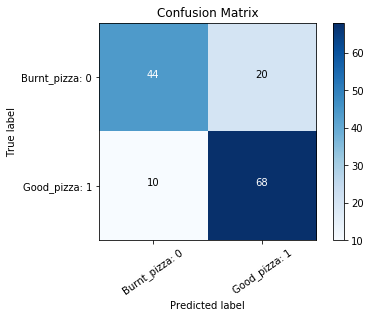

-----------------------------------------------------
Classification report
              precision    recall  f1-score   support

           0       0.81      0.69      0.75        64
           1       0.77      0.87      0.82        78

    accuracy                           0.79       142
   macro avg       0.79      0.78      0.78       142
weighted avg       0.79      0.79      0.79       142

-----------------------------------------------------
Accuracy of the model:  0.7887323943661971


In [18]:
plot_confusion_metrix(test_y, pred_y, classes=["Burnt_pizza: 0","Good_pizza: 1"])

### Step 9: Generate Plots for accuracy and validation

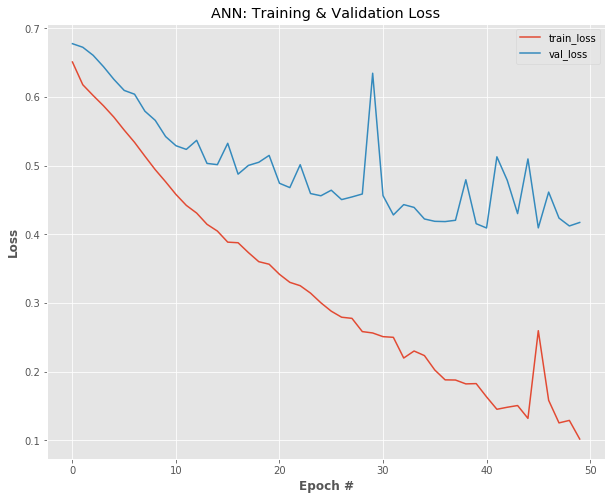

In [19]:
# plotting the training and validation loss   
# Validation Loss should be always in Decreasing order other wise the model will not perform better

N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["loss"], label="train_loss")
plt.plot(N, H.history["val_loss"], label="val_loss")
plt.title("ANN: Training & Validation Loss")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Loss", weight="bold")
plt.legend()
plt.show()

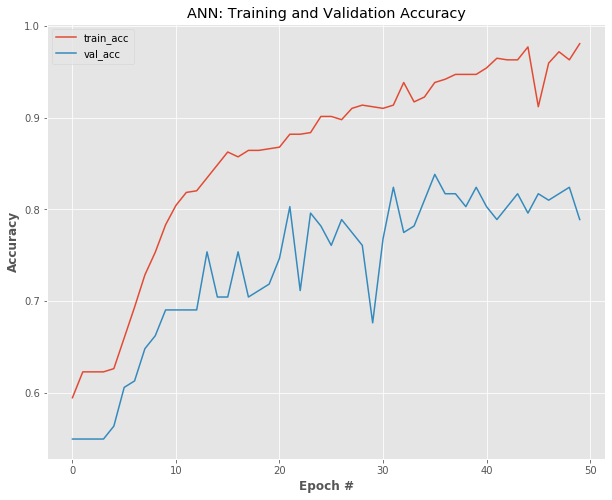

In [20]:
# plotting the training and validation accuracy
# Validation Accuracy should be always in Increasing order

N = np.arange(0, EPOCHS)
plt.style.use("ggplot")
plt.figure(figsize = [10,8])
plt.plot(N, H.history["accuracy"], label="train_acc")
plt.plot(N, H.history["val_accuracy"], label="val_acc")
plt.title("ANN: Training and Validation Accuracy")
plt.xlabel("Epoch #", weight="bold")
plt.ylabel("Accuracy", weight="bold")
plt.legend()
plt.show()

In [21]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              3146752   
                                                                 
 dense_1 (Dense)             (None, 800)               820000    
                                                                 
 dense_2 (Dense)             (None, 512)               410112    
                                                                 
 dense_3 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 4,377,890
Trainable params: 4,377,890
Non-trainable params: 0
_________________________________________________________________


### Step 10: Saving the train model

In [22]:
# save the model and label
print("[INFO] serializing network and label binarizer...")
model.save('model_ANN.h5')

[INFO] serializing network and label binarizer...


In [23]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

### Step 11: Making predictions using our trained tensorflow model

In [24]:
# import the necessary packages
from tensorflow.keras.models import load_model
import pickle
import cv2
import imutils
import matplotlib.pyplot as plt
%matplotlib inline

1/1 [==============================] - 0s 46ms/step



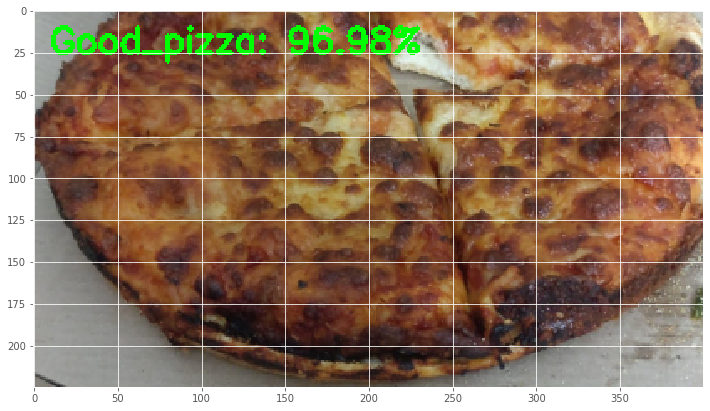

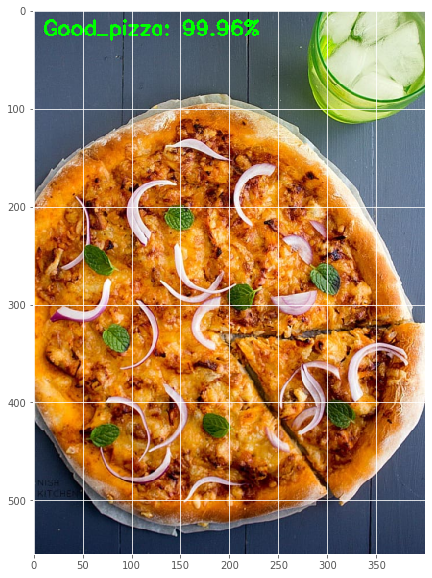

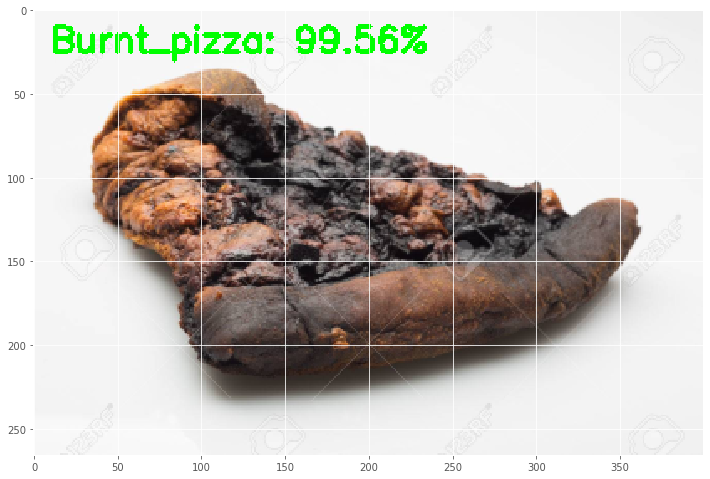

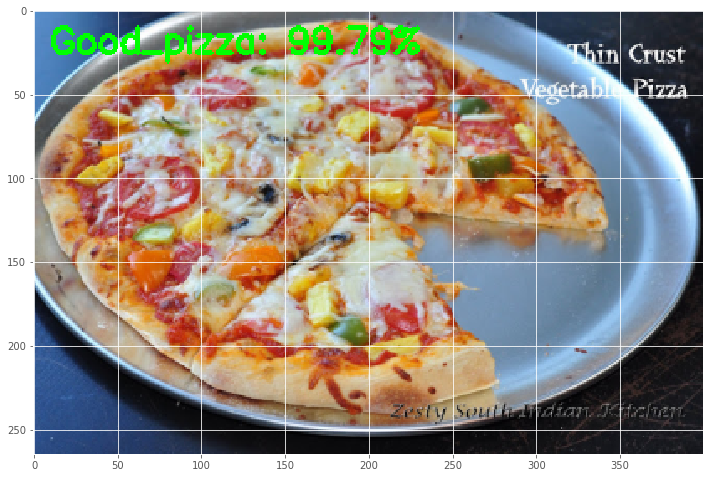

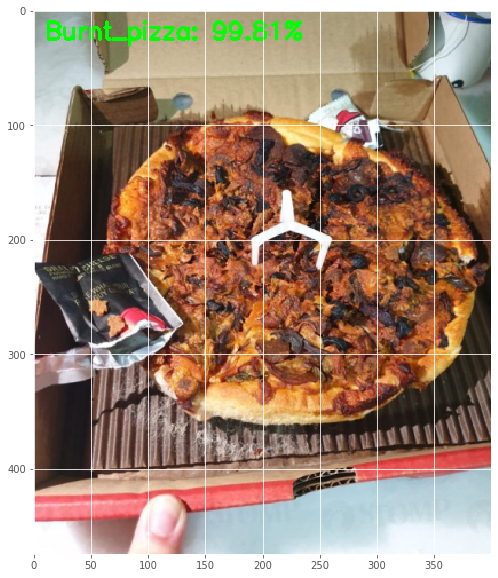

...

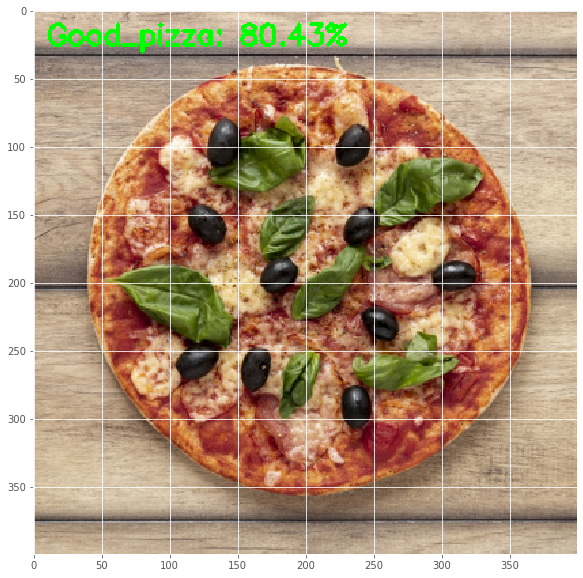

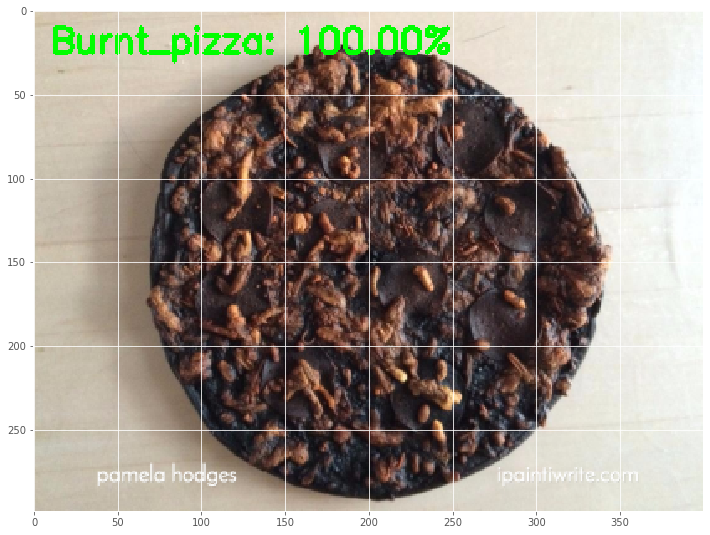

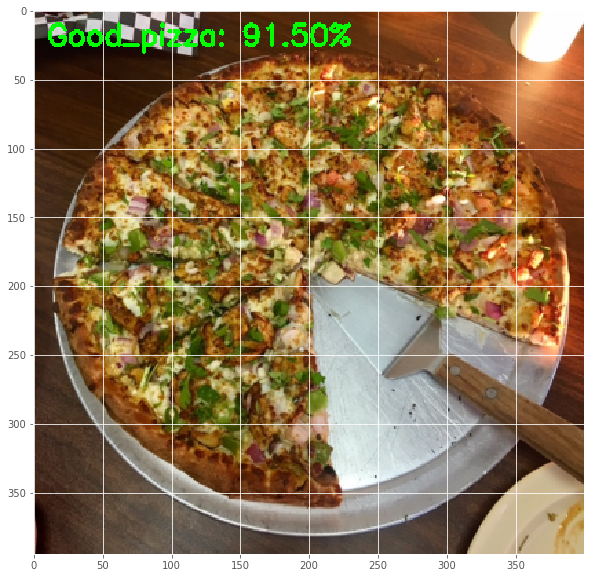

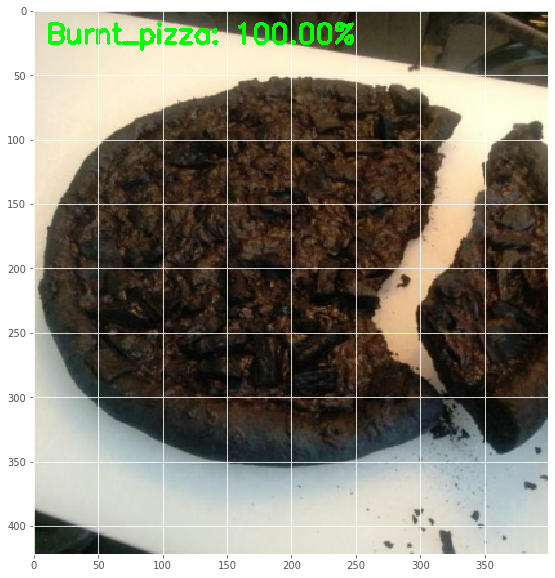

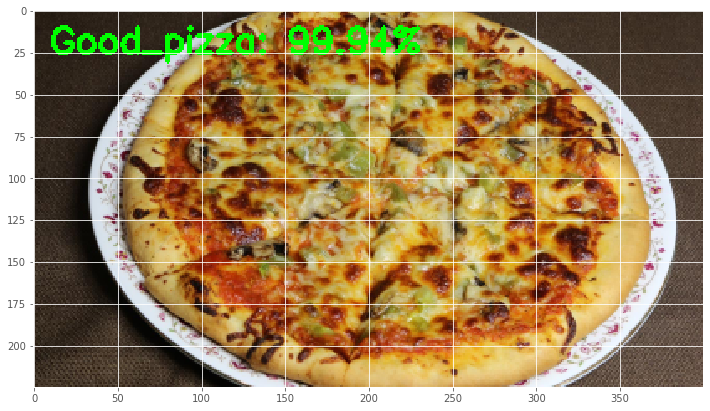

In [25]:
# load the input image and resize it to the target spatial dimensions
width = 32
height = 32

# grab the image paths and randomly shuffle them
testImagePaths = sorted(list(paths.list_images('test')))   # test data folder with random images


# progress bar 
with tqdm(total=len(testImagePaths)) as pbar:
    
    for imagePath in testImagePaths:
        image = cv2.imread(imagePath)
        output = image.copy()
        image = cv2.resize(image, (width, height))

        # scale the pixel values to [0, 1]
        image = image.astype("float") / 255.0

        # for a simple fully-connected network, flatten the image
        image = image.flatten()
        image = image.reshape((1, image.shape[0]))


        # make a prediction on the image
        preds = model.predict(image)

        # find the class label index with the largest corresponding probability
        i = preds.argmax(axis=1)[0]
        label = classes[i]
        
        label = "{}: {:.2f}%".format(label, preds[0][i] * 100)

        
        output = imutils.resize(output, width=400)
        cv2.putText(output, label, (10, 25),  cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (0, 255, 0), 2)
        
        # convert img to rgb format and display in noteboo
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)


        
        pbar.update(1)